<h1>Homework 1: Principal component analysis.</h1>

This notebook introduces the useful concept of principal component analysis, which is also a good application of linear algebra techniques. This notebook introduces the useful concept of principal component analysis, which is also a good application of linear algebra techniques. 

The flow is guided by [this Wikipedia description of how PCA works](https://en.wikipedia.org/wiki/Principal_component_analysis#Computation_using_the_covariance_method), but using SVD instead of eigenvectors of the covariance matrix, [as described here](https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca).

The data is from the dome imaging project, dated July 18, 2023. 

In [2]:
using FileIO, Images, LinearAlgebra

In [49]:
# The first step is to import the files we want to work with. 

imgDir = raw"C:\Users\anonc\Downloads\PCA_imgs"    # Change this to the location of the image directory in your system.
cd(imgDir)    # Change directories into the one with the images.
fnames = readdir()    # This gets all filenames in the working directory
imgs = load.(fnames);

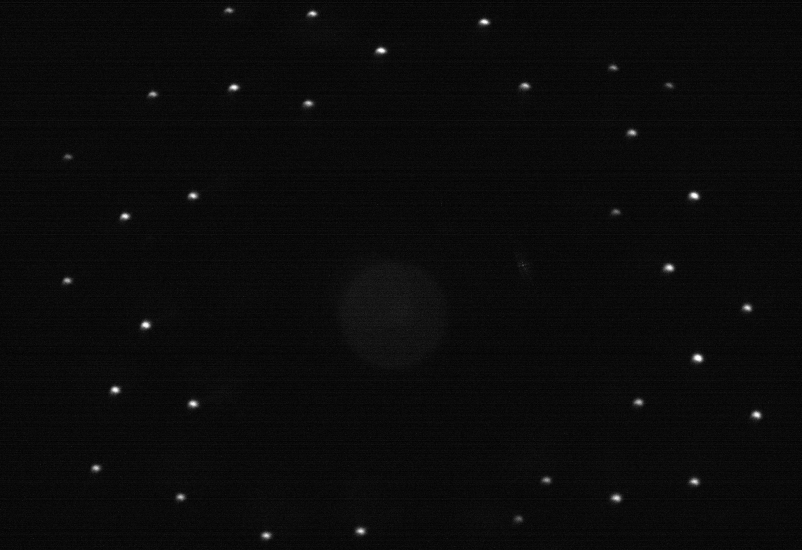

In [52]:
# Look through some of the images to get a feel for what they are.
imgs[1]

In [25]:
# We next want to convert all the images into numeric vectors. We will break this into two steps.  
# First we convert to numeric arrays.  
matrices = [convert.(Float64,img) for img in imgs]
# Check the type of matrices[1] and the type of imgs[1]. Do you understand the difference?
# Next we flatten the matrices to vectors. 
vs = [m[:] for m in matrices]
size(vs[1]), size(imgs[1])

((441100,), (550, 802))

In [26]:
# Next we want to combine all the vectors vs into one data matrix of size (length(vs),length(vs[1])), i.e. (32,441100).
dat = hcat(vs...)' # Your code here
size(dat)

(20, 441100)

In [27]:
# Compute the mean along each column of dat and subtract it from dat.
# WARNING: This cell mutates dat, so you should run the previous cell before running this one multiple times. 
datMeans = sum(dat,dims=1)/size(dat,1)  # Your code here
dat .-= datMeans
size(datMeans)

(1, 441100)

In [29]:
# Compute the SVD:
U,S,Vt = svd(dat);   # Your code here
S'

1×20 adjoint(::Vector{Float64}) with eltype Float64:
 17.2346  11.0281  7.1835  7.0061  6.93807  …  6.10117  6.07267  2.59852e-13

In [36]:
# The columns of Vt are the principal components.  Let's recast them as images.
pcs = [reshape(Vt[:,i] ./ maximum(Vt[:,i]),size(imgs[1])) for i=1:size(Vt,2)];

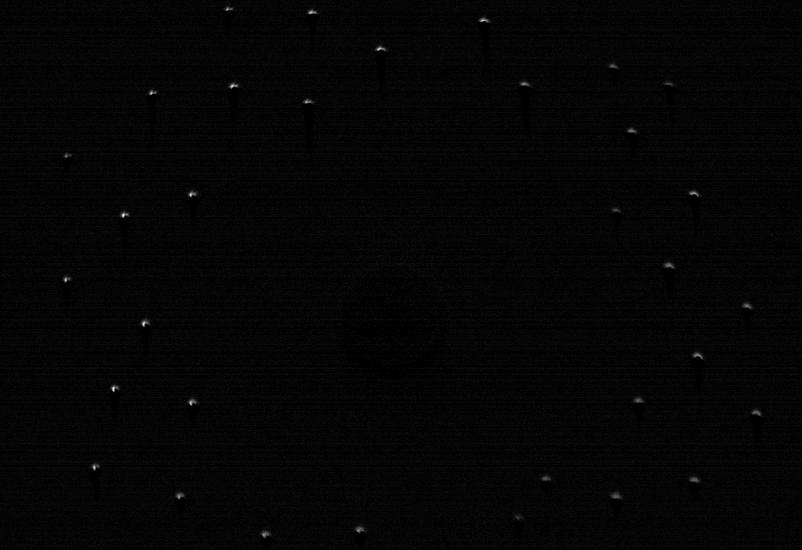

In [45]:
# Can you interpret the first three principal components? 
Gray.(pcs[1])

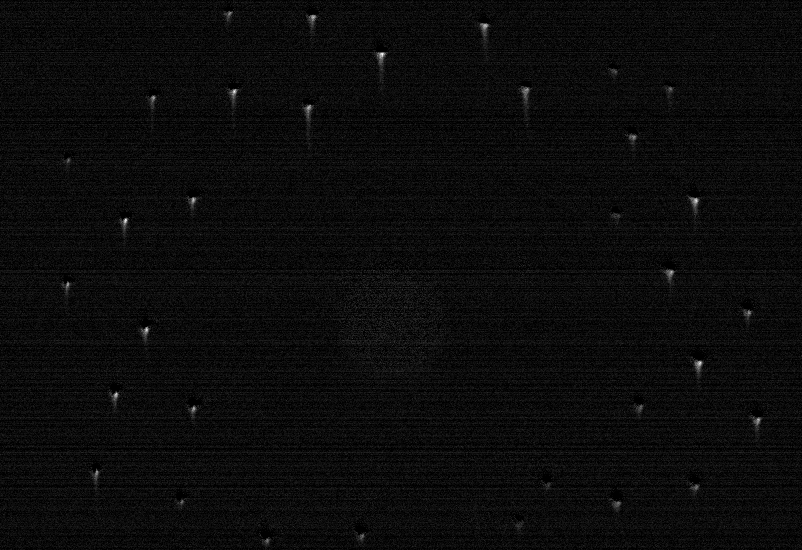

In [46]:
Gray.(pcs[2])

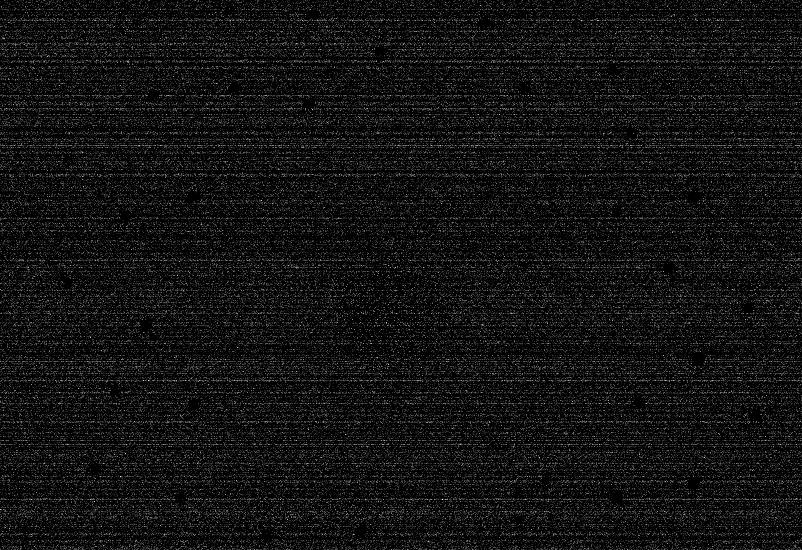

In [47]:
Gray.(pcs[3])

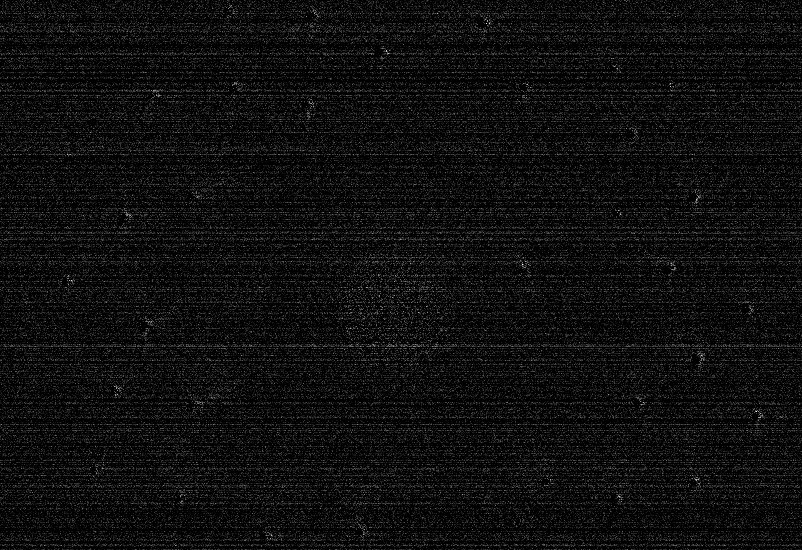

In [48]:
Gray.(pcs[4])

In [43]:
# Heatmaps are better for viewing the principal components, as the values are both positive and negative. 
using Plots

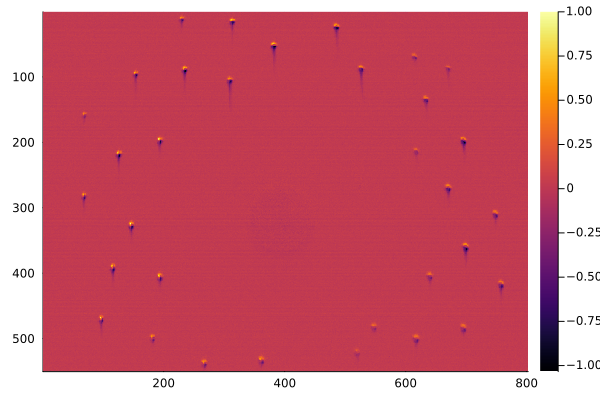

In [40]:
heatmap(pcs[1],yflip = true)

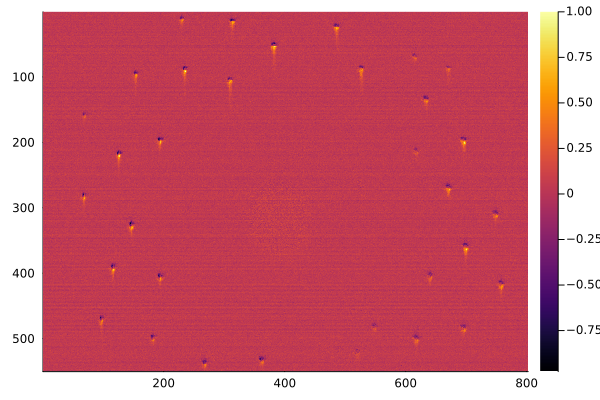

In [41]:
heatmap(pcs[2],yflip = true)

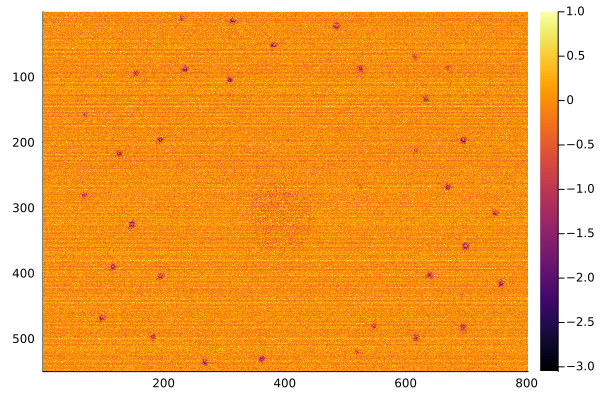

In [42]:
heatmap(pcs[3],yflip = true)